In [1]:
import numpy as np
import jax
import jax.numpy as jnp
import matplotlib.pyplot as plt
import holoviews as hv

plt.rcParams["figure.dpi"] = 300

import sys
from pathlib import Path

script_dir = Path(__file__).parent if "__file__" in globals() else Path.cwd()
src_dir = script_dir.parent / "src"
if str(src_dir) not in sys.path:
    sys.path.insert(0, str(src_dir))

from gmmnlse.constants import C_m_ps, C_um_ps, C_um_s
from gmmnlse.io import WaveguideLoader
from gmmnlse.pulse import Pulse
from gmmnlse.solver import RK4IPSolver
from gmmnlse.waveguide import Waveguide



In [2]:
root_dir = script_dir.parent
example_data_dir = root_dir / "example_data"

n_complex_path = example_data_dir / "n_complex_h_0.8_w_6_20modes.npy"
s_tensor_freq_path = example_data_dir / "s_tensor_freqs_h_0.8_w_6_10modes.npy"

n_complex_data = np.load(n_complex_path, allow_pickle=True)
s_tensor_freq_data = np.load(s_tensor_freq_path, allow_pickle=True)

num_modes = 6
mode_labels = ["TE00", "TE10", "TE20", "TE30", "TE40", "TE50"]
n_complex = n_complex_data[:, :num_modes]
s_tensor_freq = s_tensor_freq_data[:, :num_modes, :num_modes, :num_modes, :num_modes]

n_freqs = n_complex.shape[0]
wl_ref_um = 1.03
wl_sim_um = 1.55

c_um_per_s = 299792458 * 1e6
freq_center_hz = c_um_per_s / wl_ref_um
freq_min_hz = c_um_per_s / 3.0
freq_max_hz = c_um_per_s / 0.6

n_points = 50
freqs_hz = np.concatenate([
    np.linspace(freq_min_hz, freq_center_hz, n_points, endpoint=False),
    np.linspace(freq_center_hz, freq_max_hz, n_points + 1),
])

# freqs_hz matches s_tensor_freq order (without reversal)
# n_complex was created with frequencies in reversed order, so reverse it to match freqs_hz
freqs_hz = freqs_hz  # Keep this order for s_tensor_freq
n_complex = n_complex[::-1]  # Reverse to match freqs_hz order for beta calculation

waveguide_loader = WaveguideLoader.from_neff(
    freqs=freqs_hz,
    n_eff=n_complex,
    freq_disp=c_um_per_s / wl_sim_um,
    orders=9,
    s_tensor=s_tensor_freq,
    s_tensor_freq=s_tensor_freq,
    convert_to_jax=True,
    in_si_units=True,
    num_modes=num_modes,
    beta_method="polynomial",
)

In [3]:
beta_2_check = []
wavelengths_plot_min = 0.6
wavelengths_plot_max = 5.0
freqs_plot_min = C_um_s / (wavelengths_plot_max)
freqs_plot_max = C_um_s / (wavelengths_plot_min)
freqs_plot = jnp.linspace(freqs_plot_min, freqs_plot_max, 101)

for freq in freqs_plot:
    waveguide_loader_check = waveguide_loader = WaveguideLoader.from_neff(
    freqs=freqs_hz,
    n_eff=n_complex,
    freq_disp=freq,
    orders=7,
    s_tensor=s_tensor_freq,
    s_tensor_freq=s_tensor_freq,
    convert_to_jax=True,
    in_si_units=True,
    num_modes=num_modes,
    beta_method="polynomial",
    )
    beta_2_check.append(waveguide_loader_check.betas[2, :])

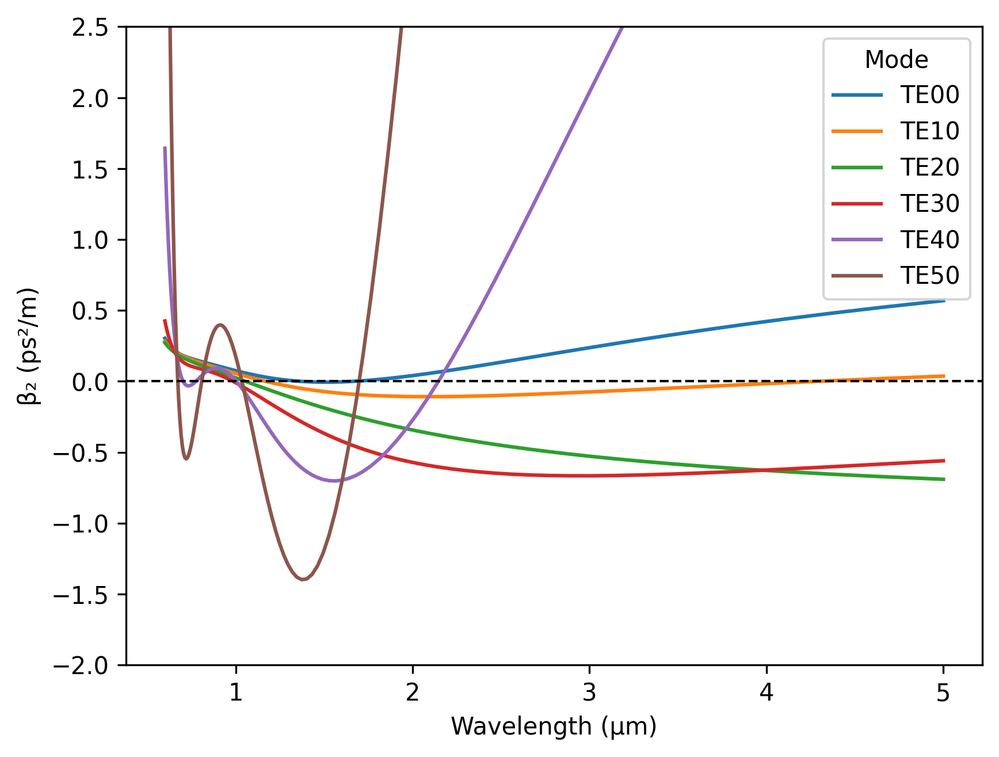

In [4]:
beta_2_check = jnp.asarray(beta_2_check)
wavelengths_um = C_um_ps / (freqs_plot * 1e-12)
curves = np.asarray(beta_2_check)
if curves.ndim == 1:
    curves = curves[None, ...]
if curves.shape[-1] != wavelengths_um.shape[0]:
    curves = np.swapaxes(curves, -1, -2)
for mode_idx, label in enumerate(mode_labels[: curves.shape[0]]):
    plt.plot(wavelengths_um, curves[mode_idx], label=label)
plt.axhline(0.0, color="black", linestyle="--", linewidth=1.0)
plt.ylim(bottom=-2, top=2.5)
plt.ylabel("β₂ (ps²/m)")
plt.xlabel("Wavelength (µm)")
plt.legend(title="Mode")
plt.show()


In [5]:
def create_waveguide(wl_sim_um: float):
    """Create waveguide with s_tensor interpolated at the simulation wavelength.
    
    This function should be called whenever wl_sim_um changes, as the s_tensor
    is interpolated based on center_freq_thz during Waveguide initialization.
    """
    return Waveguide(
        betas=waveguide_loader.betas,
        s_tensor=waveguide_loader.s_tensor,
        n2=2.4e-19,
        center_freq_thz=C_m_ps / (wl_sim_um * 1e-6),
        s_tensor_freq=waveguide_loader.s_tensor_freq,
        freqs_hz=jnp.asarray(waveguide_loader.freqs_hz) if waveguide_loader.freqs_hz is not None else None,
        num_modes=num_modes,
    )

# Create the baseline waveguide - call create_waveguide(wl_sim_um) again if wl_sim_um changes
baseline_waveguide = create_waveguide(wl_sim_um)

n_time_points = 2**16
fwhm_ps = 0.12
peak_power_w = 5000.0
time_window_ps = 60.0
z_points = jnp.linspace(0.0, 0.005, 201)  # 0 to 5 mm
snapshot_positions_mm = [1, 3, 5]
beta2 = baseline_waveguide.betas[2]
print(beta2*1e6)
baseline_waveguide.s_tensor[1, 3, 3, 3,]

[ 303057.41052825  281764.943135    271409.0354856   425030.42254447
 1643038.62189154 6390062.44662826]


Array(-50328872.38254156-0.00338132j, dtype=complex128)

In [6]:
# Calculate soliton parameters for each mode at 5 kW peak power
peak_power_soliton_w = 5000.0  # 5 kW
fwhm_ps_soliton = fwhm_ps  # Use same pulse width as simulations
T0_ps = fwhm_ps_soliton / (2.0 * np.sqrt(np.log(2.0)))  # Gaussian pulse width parameter

# Get β₂ at simulation wavelength for each mode
beta2_at_wl = np.asarray(baseline_waveguide.betas[2, :])  # Shape: (num_modes,)
beta2_abs = np.abs(beta2_at_wl)

# Calculate dispersion length: L_D = T_0² / |β₂|
# T_0 in seconds, β₂ in ps²/m, L_D in meters
T0_s = T0_ps * 1e-12
beta2_ps2_per_m = beta2_abs  
L_D = (T0_ps ** 2) / beta2_ps2_per_m  # Result in meters

# Calculate nonlinear length: L_NL = 1 / (γ * P_0)
lambda_m = wl_sim_um * 1e-6
n2_m2_per_w = 2.4e-19  # m²/W

# Get effective nonlinear coefficient from s_tensor diagonal
gamma_per_w_per_m = np.zeros(num_modes)
for mode_idx in range(num_modes):
    s_self = baseline_waveguide.s_tensor[mode_idx, mode_idx, mode_idx, mode_idx]
    s_self_val = float(np.abs(np.asarray(s_self)))
    # s_tensor is in units that depend on the normalization
    gamma_per_w_per_m[mode_idx] = s_self_val * (2.0 * np.pi * n2_m2_per_w) / (lambda_m)

# Nonlinear length: L_NL = 1 / (γ * P_0)
L_NL = 1.0 / (gamma_per_w_per_m * peak_power_soliton_w)

# Soliton number: N = sqrt(L_D / L_NL)
N_soliton = np.sqrt(L_D / L_NL)

# Calculate modal walk-off length: L_W = T_0 / |Δβ₁|
beta1_at_wl = np.asarray(baseline_waveguide.betas[1, :])  # β₁ for each mode (ps/m)
beta1_ref = beta1_at_wl[0]  # Reference: TE00
delta_beta1 = np.abs(beta1_at_wl - beta1_ref)  # Group velocity mismatch relative to TE00
# Avoid division by zero for the reference mode itself
delta_beta1[0] = np.inf  # TE00 has no walk-off relative to itself
L_W = T0_ps / delta_beta1  # Walk-off length in meters (ps / (ps/m) = m)
L_W[0] = np.inf  # Set to inf for reference mode

# Print results
print("Soliton Parameters at 5 kW Peak Power:")
print("=" * 100)
print(f"{'Mode':<8} {'β₂ (ps²/m)':<15} {'L_D (mm)':<12} {'L_NL (mm)':<12} {'L_W (mm)':<12} {'N':<10}")
print("-" * 100)
for mode_idx in range(num_modes):
    beta2_ps2_m = beta2_abs[mode_idx]
    l_w_str = f"{L_W[mode_idx]*1e3:>11.4f}" if np.isfinite(L_W[mode_idx]) else "      inf"
    print(
        f"{mode_labels[mode_idx]:<8} "
        f"{beta2_ps2_m:>14.4f} "
        f"{L_D[mode_idx]*1e3:>11.4f} "
        f"{L_NL[mode_idx]*1e3:>11.4f} "
        f"{l_w_str:>12} "
        f"{N_soliton[mode_idx]:>9.4f}"
    )
print("=" * 100)
print("Note: L_W is walk-off length relative to TE00 mode")



Soliton Parameters at 5 kW Peak Power:
Mode     β₂ (ps²/m)      L_D (mm)     L_NL (mm)    L_W (mm)     N         
----------------------------------------------------------------------------------------------------
TE00             0.3031     17.1377      0.5458          inf    5.6037
TE10             0.2818     18.4327      0.5460      15.4808    5.8105
TE20             0.2714     19.1361      0.5463       4.7742    5.9185
TE30             0.4250     12.2196      0.5468       1.5179    4.7275
TE40             1.6430      3.1610      0.5474       0.3649    2.4031
TE50             6.3901      0.8128      0.5481       0.1012    1.2177
Note: L_W is walk-off length relative to TE00 mode


In [ ]:
def build_pulse(modal_vector: jnp.ndarray, peak_power_w: float = peak_power_w, noise_seed: int = 123, normalize = False) -> Pulse:
    coeffs = jnp.zeros(num_modes, dtype=jnp.complex128).at[:modal_vector.shape[0]].set(modal_vector)
    pulse =  Pulse.gaussian(
        peak_power_w=peak_power_w,
        fwhm_ps=fwhm_ps,
        time_window_ps=time_window_ps,
        n_modes=num_modes,
        n_time_points=n_time_points,
        center_wavelength_um=wl_sim_um,
        modal_coefficients=coeffs,
        normalize_modal_coefficients=normalize,
        include_shot_noise=True,
        noise_seed=noise_seed,
    )
    print(f"Pulse min wavelength: {np.min(pulse.freqs_abs_thz) * 1e12} nm")
    print(f"Pulse max wavelength: {np.max(pulse.freqs_abs_thz) * 1e12} nm")
    return pulse


def _wavelength_axis(pulse: Pulse):
    freqs_abs_thz = np.asarray(pulse.freqs_abs_thz)
    freqs_shifted_thz = np.fft.fftshift(freqs_abs_thz)
    freqs_shifted_hz = freqs_shifted_thz * 1e12
    c_um_per_s = 299792458 * 1e6
    wavelengths_um = c_um_per_s / np.where(freqs_shifted_hz != 0.0, freqs_shifted_hz, np.nan)
    mask = np.isfinite(wavelengths_um) & (wavelengths_um > 0.0) #& (wavelengths_um <= 4.0)
    return wavelengths_um, mask


def _db(x: np.ndarray) -> np.ndarray:
    return 10 * np.log10(np.maximum(np.abs(x), 1e-30))


def _db_rel(x: np.ndarray) -> np.ndarray:
    values_db = _db(x)
    max_val = np.max(values_db)
    return np.where(max_val > -np.inf, values_db - max_val, np.full_like(values_db, -80.0))


def plot_input_output(pulse: Pulse, result: dict, title: str):
    input_field = np.asarray(pulse.field)
    output_field = np.asarray(result["final_pulse"].field)
    time_axis = np.asarray(pulse.t)

    # Compute total intensity using coherent sum
    input_total_field = np.sum(input_field, axis=0)
    output_total_field = np.sum(output_field, axis=0)
    input_total_intensity = np.abs(input_total_field)**2
    output_total_intensity = np.abs(output_total_field)**2

    wavelengths_um, mask = _wavelength_axis(pulse)
    input_spec = np.fft.fftshift(np.fft.fft(input_field, axis=-1), axes=-1)
    output_spec = np.fft.fftshift(np.fft.fft(output_field, axis=-1), axes=-1)
    # Compute total spectral intensity
    input_total_spec = np.abs(np.sum(input_spec, axis=0))**2
    output_total_spec = np.abs(np.sum(output_spec, axis=0))**2

    fig, axes = plt.subplots(2, 2, figsize=(12, 6))
    axes[0, 0].plot(time_axis, _db_rel(input_total_intensity), label="Input")
    axes[0, 0].plot(time_axis, _db_rel(output_total_intensity), label="Output")
    axes[0, 0].set_xlabel("Time (ps)")
    axes[0, 0].set_ylabel("|A(t)| (dB)")
    axes[0, 0].legend()

    # For phase, use the total field (sum of complex fields)
    input_total_field = np.sum(input_field, axis=0)
    output_total_field = np.sum(output_field, axis=0)
    # For phase, use the total field (already computed above)
    axes[0, 1].plot(time_axis, np.angle(input_total_field), label="Input")
    axes[0, 1].plot(time_axis, np.angle(output_total_field), label="Output")
    axes[0, 1].set_xlabel("Time (ps)")
    axes[0, 1].set_ylabel("Phase (rad)")
    axes[0, 1].legend()

    axes[1, 0].plot(wavelengths_um[mask], _db_rel(input_total_spec[mask]), label="Input")
    axes[1, 0].plot(wavelengths_um[mask], _db_rel(output_total_spec[mask]), label="Output")
    axes[1, 0].set_xlabel("Wavelength (µm)")
    axes[1, 0].set_ylabel("|A(λ)| (dB)")
    axes[1, 0].set_ylim(bottom = -80)
    axes[1, 0].legend()

    axes[1, 1].plot(
        wavelengths_um[mask],
        _db_rel(input_total_spec[mask]),
        label="Input",
    )
    axes[1, 1].plot(
        wavelengths_um[mask],
        _db_rel(output_total_spec[mask]),
        label="Output",
    )
    axes[1, 1].set_xlabel("Wavelength (µm)")
    axes[1, 1].set_ylabel("Relative power (dB)")
    axes[1, 1].legend()
    axes[1, 1].set_ylim(bottom = -80)

    fig.suptitle(title)
    fig.tight_layout()


def plot_propagation(
    pulse: Pulse,
    result: dict,
    title: str,
    temporal_sum_type: str = "coherent",
    spectral_sum_type: str = "coherent",
    time_ax_lim=(-5, 5),
):
    """Original horizontal propagation figure used throughout the notebook."""

    ys = np.asarray(result["ys"])  # (z, modes, time)

    if temporal_sum_type == "coherent":
        total_field = np.sum(ys, axis=1)
        total_field_power = np.abs(total_field) ** 2
    elif temporal_sum_type == "incoherent":
        total_field_power = np.sum(np.abs(ys) ** 2, axis=1)
    else:
        raise ValueError("temporal_sum_type must be 'coherent' or 'incoherent'")

    temporal_norm = np.array(total_field_power / total_field_power.max(), dtype=np.float64)
    temporal_db = 10 * np.log10(np.clip(temporal_norm, 1e-30, None))

    wavelengths_um, mask = _wavelength_axis(pulse)
    wavelength_window = (wavelengths_um >= 0.5) & (wavelengths_um <= 3.0)
    spectral_mask = mask & wavelength_window
    if not np.any(spectral_mask):
        spectral_mask = mask

    ys_freq = np.fft.fftshift(np.fft.fft(ys, axis=-1), axes=-1)

    if spectral_sum_type == "coherent":
        total_spectrum = np.sum(ys_freq, axis=1)
        total_spectrum_power = np.abs(total_spectrum) ** 2
    elif spectral_sum_type == "incoherent":
        total_spectrum_power = np.sum(np.abs(ys_freq) ** 2, axis=1)
    else:
        raise ValueError("spectral_sum_type must be 'coherent' or 'incoherent'")

    spectrum_norm = np.array(total_spectrum_power / total_spectrum_power.max(), dtype=np.float64)
    spectrum_db = 10 * np.log10(np.clip(spectrum_norm[:, spectral_mask], 1e-30, None))

    z_mm = np.asarray(result["ts"]) * 1e3

    fig, axes = plt.subplots(1, 2, figsize=(12, 4), sharey=True)
    TT, ZZ = np.meshgrid(np.asarray(pulse.t), z_mm)
    pcm = axes[0].pcolormesh(TT, ZZ, temporal_db, shading="auto", vmin=-80, vmax=0, cmap="magma")
    axes[0].set_title(f"Temporal evolution: {title}")
    axes[0].set_xlabel("Time (ps)")
    axes[0].tick_params(left=False, labelleft=False, right=True, labelright=True)
    axes[0].set_xlim(time_ax_lim[0], time_ax_lim[1])
    cbar1 = fig.colorbar(pcm, ax=axes[0], label="Power (dB)", location="left", pad=0.01)
    cbar1.ax.yaxis.set_ticks_position("left")
    cbar1.ax.yaxis.set_label_position("left")

    WW, ZZ2 = np.meshgrid(wavelengths_um[spectral_mask], z_mm)
    pcm2 = axes[1].pcolormesh(WW, ZZ2, spectrum_db, shading="auto", vmin=-80, vmax=0, cmap="magma")
    axes[1].set_title(f"Spectral evolution: {title}")
    axes[1].set_xlabel("Wavelength (µm)")
    axes[1].set_ylabel("Distance (mm)")
    axes[1].set_xlim(0.5, 3.0)
    fig.colorbar(pcm2, ax=axes[1], label="Power (dB)", pad=0.01)

    fig.tight_layout()


def plot_propagation_vertical(
    pulse: Pulse,
    result: dict,
    title: str,
    temporal_sum_type: str = "coherent",
    spectral_sum_type: str = "coherent",
    time_ax_lim=(-5, 5),
):
    """Vertical version with both colorbars on the right and y-axis labels on the left."""

    ys = np.asarray(result["ys"])  # (z, modes, time)

    if temporal_sum_type == "coherent":
        total_field = np.sum(ys, axis=1)
        total_field_power = np.abs(total_field) ** 2
    elif temporal_sum_type == "incoherent":
        total_field_power = np.sum(np.abs(ys) ** 2, axis=1)
    else:
        raise ValueError("temporal_sum_type must be 'coherent' or 'incoherent'")

    temporal_norm = np.array(total_field_power / total_field_power.max(), dtype=np.float64)
    temporal_db = 10 * np.log10(np.clip(temporal_norm, 1e-30, None))

    wavelengths_um, mask = _wavelength_axis(pulse)
    wavelength_window = (wavelengths_um >= 0.5) & (wavelengths_um <= 3.0)
    spectral_mask = mask & wavelength_window
    if not np.any(spectral_mask):
        spectral_mask = mask

    ys_freq = np.fft.fftshift(np.fft.fft(ys, axis=-1), axes=-1)

    if spectral_sum_type == "coherent":
        total_spectrum = np.sum(ys_freq, axis=1)
        total_spectrum_power = np.abs(total_spectrum) ** 2
    elif spectral_sum_type == "incoherent":
        total_spectrum_power = np.sum(np.abs(ys_freq) ** 2, axis=1)
    else:
        raise ValueError("spectral_sum_type must be 'coherent' or 'incoherent'")

    spectrum_norm = np.array(total_spectrum_power / total_spectrum_power.max(), dtype=np.float64)
    spectrum_db = 10 * np.log10(np.clip(spectrum_norm[:, spectral_mask], 1e-30, None))

    z_mm = np.asarray(result["ts"]) * 1e3

    fig, axes = plt.subplots(2, 1, figsize=(7, 8), sharey=True)
    temporal_ax, spectral_ax = axes

    TT, ZZ = np.meshgrid(np.asarray(pulse.t), z_mm)
    pcm = temporal_ax.pcolormesh(
        TT,
        ZZ,
        temporal_db,
        shading="auto",
        vmin=-80,
        vmax=0,
        cmap="magma",
    )
    temporal_ax.set_title(f"Temporal evolution: {title}")
    temporal_ax.set_xlabel("Time (ps)")
    temporal_ax.set_ylabel("Distance (mm)")
    temporal_ax.set_xlim(time_ax_lim[0], time_ax_lim[1])
    temporal_ax.tick_params(left=True, labelleft=True)
    fig.colorbar(pcm, ax=temporal_ax, label="Power (dB)", pad=0.02)

    WW, ZZ2 = np.meshgrid(wavelengths_um[spectral_mask], z_mm)
    pcm2 = spectral_ax.pcolormesh(
        WW,
        ZZ2,
        spectrum_db,
        shading="auto",
        vmin=-80,
        vmax=0,
        cmap="magma",
    )
    spectral_ax.set_title(f"Spectral evolution: {title}")
    spectral_ax.set_xlabel("Wavelength (µm)")
    spectral_ax.set_ylabel("Distance (mm)")
    spectral_ax.tick_params(left=True, labelleft=True)
    spectral_ax.set_xlim(0.5, 3.0)
    fig.colorbar(pcm2, ax=spectral_ax, label="Power (dB)", pad=0.02)

    fig.tight_layout()


def plot_length_snapshots(pulse: Pulse, result: dict, title: str, 
                            time_ax_x_lim = [-5, 5], time_ax_y_lim = [-175, 10], 
                            spect_ax_y_lim = [-80, 0], spect_ax_x_lim = [0.5, 16], sum_type = "coherent"):
    ys = np.asarray(result["ys"])  # (z, modes, time)
    z_mm = np.asarray(result["ts"]) * 1e3
    time_axis = np.asarray(pulse.t)
    wavelengths_um, mask = _wavelength_axis(pulse)

    n_cols = len(snapshot_positions_mm)
    fig, axes = plt.subplots(
        2,
        n_cols,
        figsize=(4 * n_cols, 6),
        sharex="row",
        sharey="row",
    )
    if n_cols == 1:
        axes = np.array([[axes[0]], [axes[1]]])

    total_floor = -200.0

    for col, snapshot_mm in enumerate(snapshot_positions_mm):
        z_idx = int(np.argmin(np.abs(z_mm - snapshot_mm)))
        fields = ys[z_idx]
        fields_freq = np.fft.fftshift(np.fft.fft(fields, axis=-1), axes=-1)
        if sum_type == 'coherent':
            # Coherent sum: I(t) = |Σ_p A_p(t)|² 
            total_field = np.sum(fields, axis=0)
            total_field_intensity = np.abs(total_field)**2
            # Coherent sum: S(ω) = |Σ_p A_p(ω)|²
            total_spectrum = np.sum(fields_freq, axis=0)
            total_spectrum_intensity = np.abs(total_spectrum)**2
        elif sum_type == 'incoherent':
            # Coherent sum: I(t) = |Σ_p A_p(t)|² 
            total_field_intensity = np.sum(np.abs(fields)**2, axis=0)
            total_spectrum_intensity = np.sum(np.abs(fields_freq)**2, axis=0)

        total_time_peak = np.max(total_field_intensity)
        total_spec_peak = np.max(total_spectrum_intensity[mask])

        total_time_db = 10 * np.log10(np.maximum(total_field_intensity, 1e-30) / total_time_peak)
        total_spec_db = 10 * np.log10(np.maximum(total_spectrum_intensity[mask], 1e-30) / total_spec_peak)

        axes[0, col].plot(time_axis, total_time_db, color="black", linewidth=2, label="Total")
        axes[1, col].plot(wavelengths_um[mask], total_spec_db, color="black", linewidth=2, label="Total")

        for mode_idx in range(num_modes):
            label = mode_labels[mode_idx]
            mode_field = fields[mode_idx]
            # Normalize mode intensity to total intensity peak (consistent with coherent sum)
            mode_time_intensity = np.abs(mode_field)**2
            mode_time_db = 10 * np.log10(np.maximum(mode_time_intensity, 1e-30) / total_time_peak)
            # mode_time_db = np.maximum(mode_time_db, total_floor)
            axes[0, col].plot(time_axis, mode_time_db, alpha=0.6, label=label)

            spectrum = np.fft.fftshift(np.fft.fft(mode_field))
            mode_spec_intensity = np.abs(spectrum)**2
            mode_spec_db = 10 * np.log10(np.maximum(mode_spec_intensity[mask], 1e-30) / total_spec_peak)
            # mode_spec_db = np.maximum(mode_spec_db, total_floor)
            axes[1, col].plot(wavelengths_um[mask], mode_spec_db, alpha=0.6, label=label)

        axes[0, col].set_title(f"z = {snapshot_mm:.1f} mm")
        if col == 0:
            axes[0, col].set_ylabel("|A(t)| (dB)")
            axes[1, col].set_ylabel("|A(λ)| (dB)")
        else:
            axes[0, col].set_ylabel("")
            axes[1, col].set_ylabel("")
        axes[0, col].set_ylim(-200, 0)
        axes[1, col].set_ylim(spect_ax_y_lim[0], spect_ax_y_lim[1])
        axes[1, col].set_xlim(spect_ax_x_lim[0], spect_ax_x_lim[1])
        axes[0, col].set_xlabel("Time (ps)")
        axes[1, col].set_xlabel("Wavelength (µm)")

        if col == n_cols - 1:
            axes[0, col].legend(loc="upper right", fontsize="small")
            axes[1, col].legend(loc="upper right", fontsize="small")

        axes[0, col].set_xlim(time_ax_x_lim[0], time_ax_x_lim[1])
        axes[0, col].set_ylim(time_ax_y_lim[0], time_ax_y_lim[1])
    fig.suptitle(title)
    fig.tight_layout(rect=(0.0, 0.05, 1.0, 0.95))

In [10]:
def run_baseline_sim(modal_vector: jnp.ndarray, peak_power_w: float = peak_power_w, noise_seed: int = 123, z_points: jnp.ndarray = z_points, dz: float = 5e-6, normalize = False):
    pulse = build_pulse(modal_vector, peak_power_w, noise_seed=noise_seed, normalize=normalize)
    solver = RK4IPSolver(
        waveguide=baseline_waveguide,
        pulse=pulse,
        dz=dz,
        include_self_steepening=True,
        boundary_mode="both",
        wavelength_window_um=[0.5, 16],
        boundary_order=20,  # Super-Gaussian order for boundary windows
        time_boundary_order=None,  # Use boundary_order if None
        freq_boundary_order=[20, 50],
        time_window_fraction=0.8,  # Fraction of time window preserved
    )
    solver.plot_boundary(xlim_min = 0.3, xlim_max = 1.0)
    result = solver.solve(z_points, progress_bar=True)
    return pulse, result


# modal_fundamental = jnp.array([1, 0, 0, 0, 0, 0])
# pulse_test = run_baseline_sim(modal_fundamental, peak_power_w=5000, dz=5e-6)

## Fundamental Mode Only


Pulse min wavelength: -352718844301075.25 nm
Pulse max wavelength: 739531155698924.8 nm


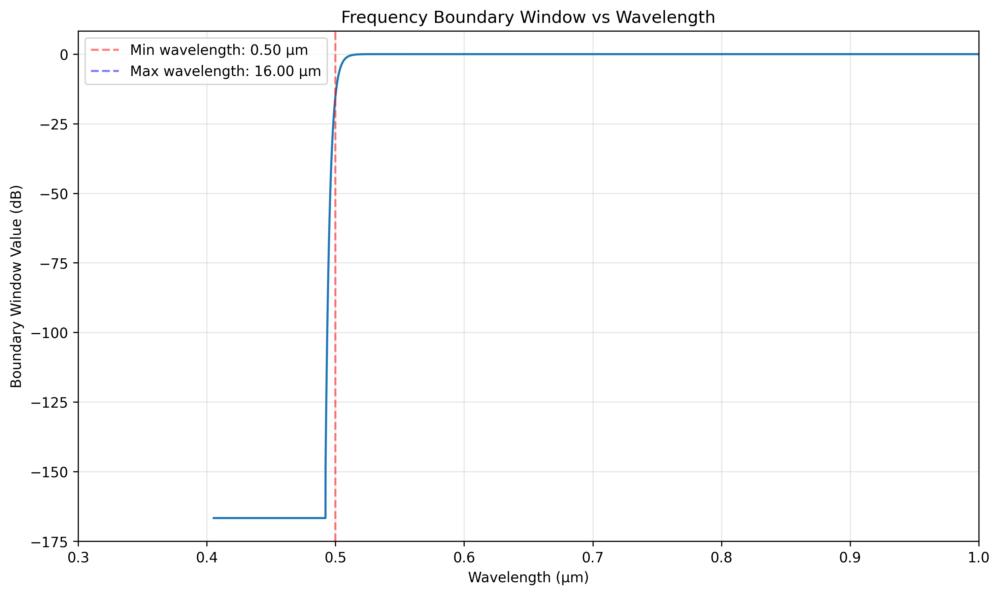

RK4IP Progress:   0%|          | 0.000/5.000 mm [00:00<?, ?mm/s]

In [11]:
modal_fundamental = jnp.array([1, 0, 0, 0, 0, 0])
peak_power_w_fundamental = 10000
pulse_fundamental, result_fundamental = run_baseline_sim(modal_fundamental, peak_power_w=peak_power_w_fundamental, dz=5e-6)

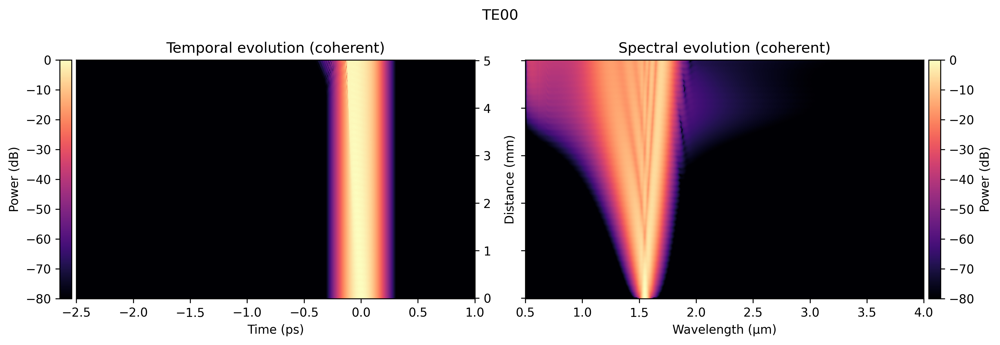

In [57]:
fig, (ax_temporal, ax_spectral) = plt.subplots(1, 2, figsize=(12, 4), sharey=True)
result_fundamental.plot_propagation(ax_temporal, ax_spectral, temporal_sum_type="coherent", spectral_sum_type="coherent", layout="horizontal", time_ax_lim=(-2.5, 1))
fig.suptitle("TE00")
fig.tight_layout()
plt.show()


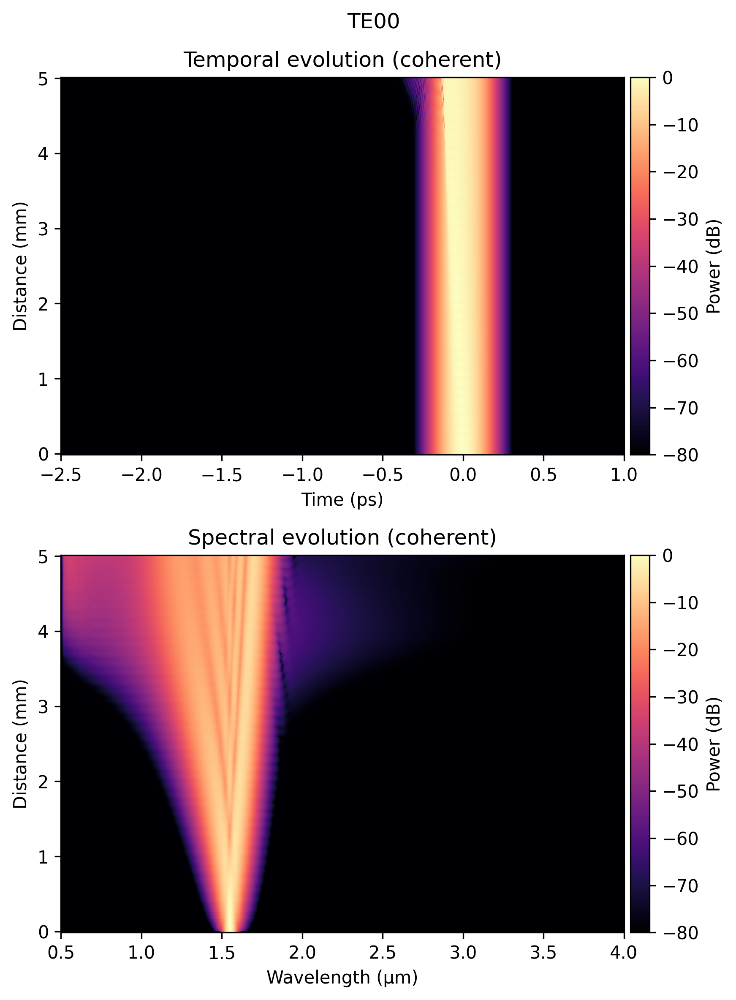

In [14]:
fig, (ax_temporal, ax_spectral) = plt.subplots(2, 1, figsize=(6, 8), sharex=False)
result_fundamental.plot_propagation(ax_temporal, ax_spectral, temporal_sum_type="coherent", spectral_sum_type="coherent", layout="vertical", time_ax_lim=(-2.5, 1))
fig.suptitle("TE00")
fig.tight_layout()
plt.show()


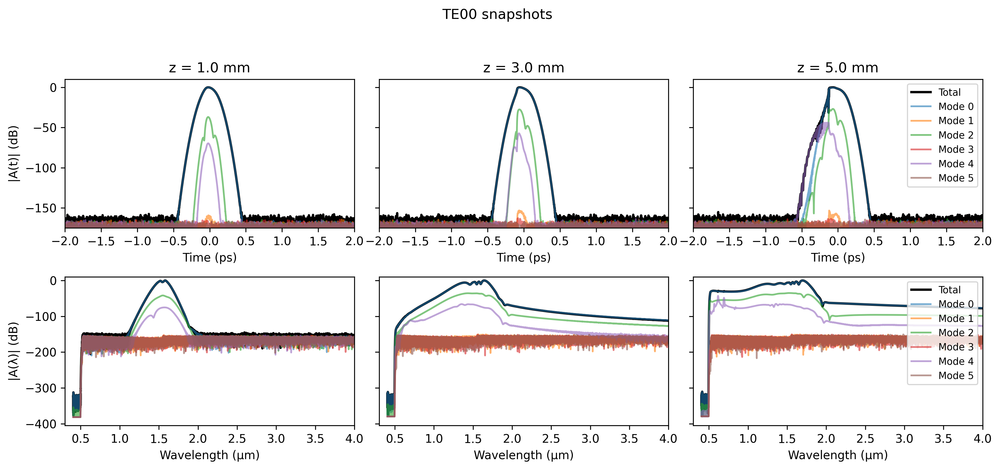

In [15]:
n_cols = len(snapshot_positions_mm)
fig, axes = plt.subplots(2, n_cols, figsize=(4 * n_cols, 6), sharex="row", sharey="row")
if n_cols == 1:
    axes = np.array([[axes[0]], [axes[1]]])
result_fundamental.plot_snapshot(axes, snapshot_positions_mm, snapshot_scale="mm",
                                  time_ax_x_lim=[-2, 2], time_ax_y_lim=[-175, 10], 
                                  spect_ax_x_lim=[0.3, 4], spect_ax_y_lim=[-405, 10])
fig.suptitle("TE00 snapshots")
fig.tight_layout(rect=(0.0, 0.05, 1.0, 0.95))
plt.show()


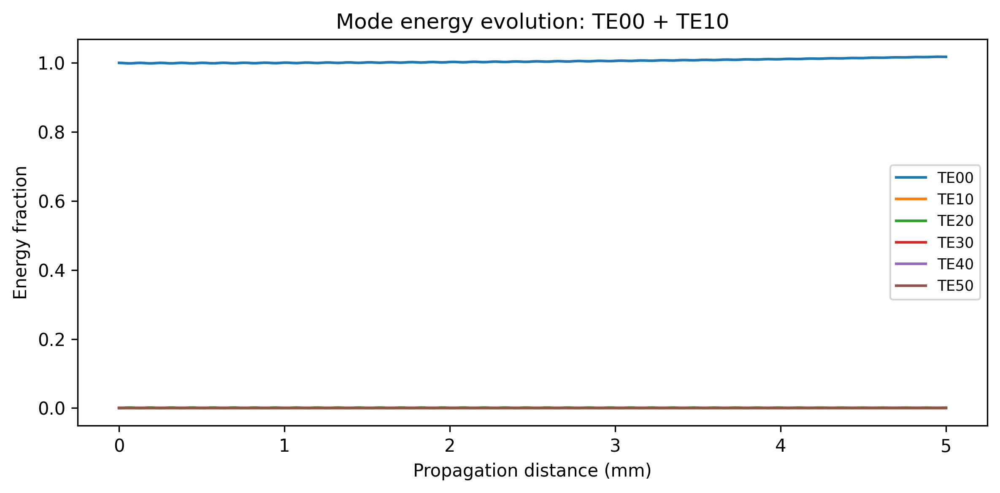

In [16]:
ys_first = np.asarray(result_fundamental["ys"])  # (z, modes, time)
z_mm = np.asarray(result_fundamental["ts"]) * 1e3
mode_energy = np.sum(np.abs(ys_first) ** 2, axis=-1)
total_energy = np.sum(mode_energy, axis=1, keepdims=True)
initial_total_energy = total_energy[0, 0]
energy_fraction = mode_energy / np.maximum(initial_total_energy, 1e-30)


plt.figure(figsize=(8, 4))
for mode_idx in range(num_modes):
    plt.plot(z_mm, energy_fraction[:, mode_idx], label=mode_labels[mode_idx])
plt.xlabel("Propagation distance (mm)")
plt.ylabel("Energy fraction")
plt.title("Mode energy evolution: TE00 + TE10")
plt.legend(loc="best", fontsize="small")
plt.tight_layout()



## Equal Mode Excitation

Pulse min wavelength: -352718844301075.25 nm
Pulse max wavelength: 739531155698924.8 nm


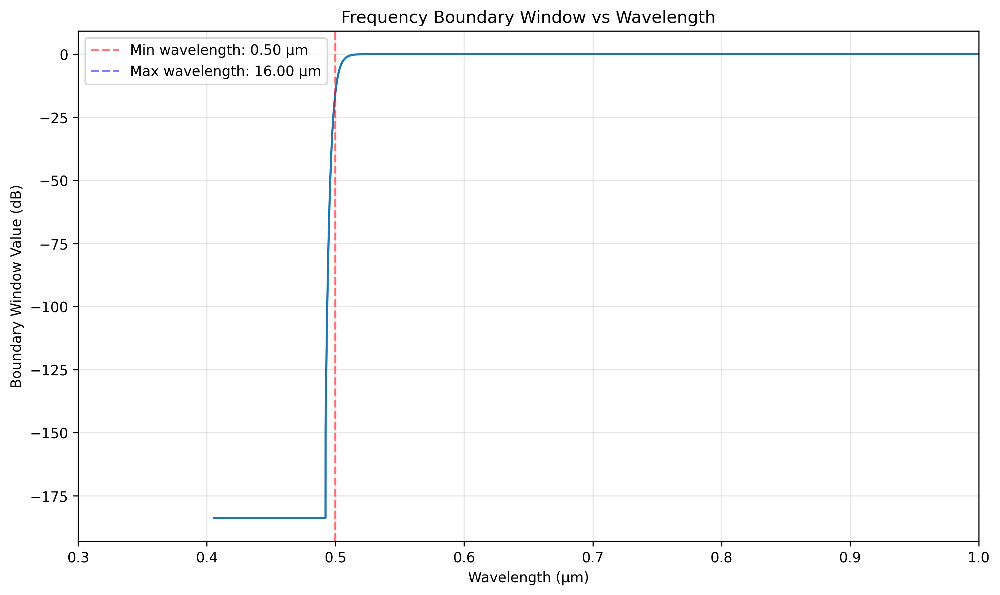

RK4IP Progress:   0%|          | 0.000/5.000 mm [00:00<?, ?mm/s]

In [17]:
modal_equal = jnp.array([1, 1, 1, 1, 1, 1])

pulse_equal, result_equal = run_baseline_sim(modal_equal, peak_power_w=2000, dz=5e-6)


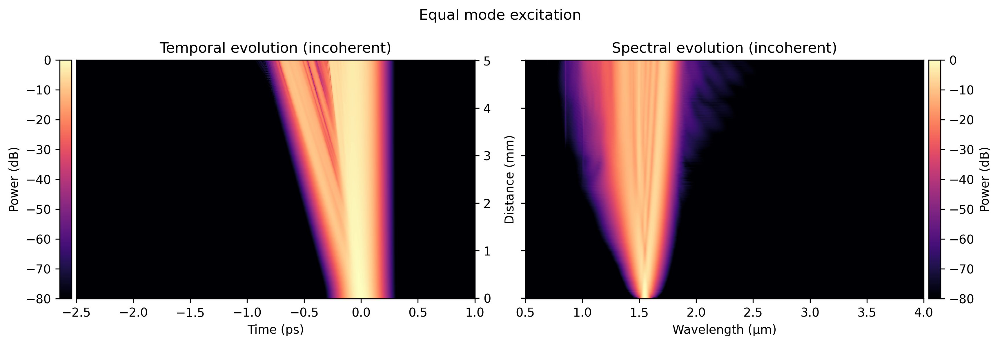

In [19]:
fig, (ax_temporal, ax_spectral) = plt.subplots(1, 2, figsize=(12, 4), sharey=True)
result_equal.plot_propagation(ax_temporal, ax_spectral, temporal_sum_type="incoherent", spectral_sum_type="incoherent", layout="horizontal", time_ax_lim=(-2.5, 1))
fig.suptitle("Equal mode excitation")
fig.tight_layout()
plt.show()

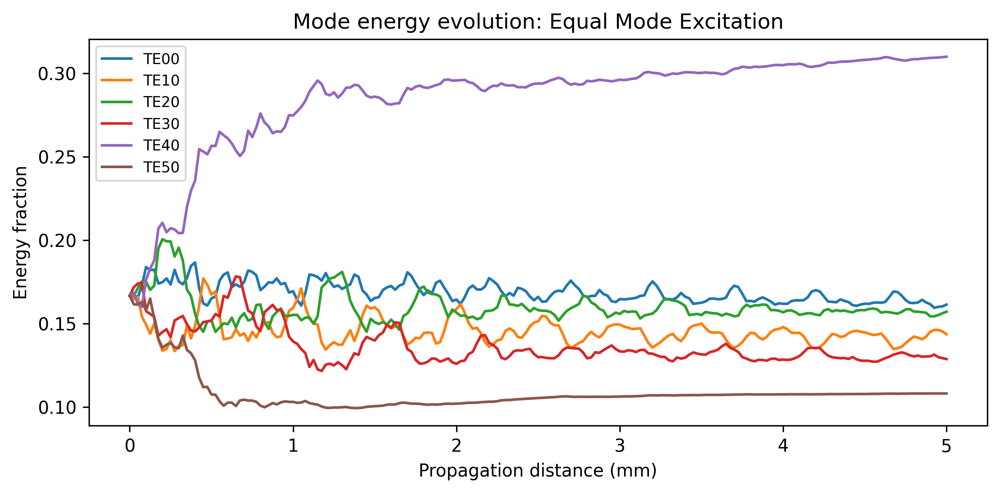

In [50]:
ys_first = np.asarray(result_equal["ys"])  # (z, modes, time)
z_mm = np.asarray(result_equal["ts"]) * 1e3
mode_energy = np.sum(np.abs(ys_first) ** 2, axis=-1)
total_energy = np.sum(mode_energy, axis=1, keepdims=True)
initial_total_energy = total_energy[0, 0]
energy_fraction = mode_energy / np.maximum(initial_total_energy, 1e-30)

# Diagnostic: check total energy evolution
total_energy_normalized = total_energy[:, 0] / initial_total_energy

plt.figure(figsize=(8, 4))
for mode_idx in range(num_modes):
    plt.plot(z_mm, energy_fraction[:, mode_idx], label=mode_labels[mode_idx])
plt.xlabel("Propagation distance (mm)")
plt.ylabel("Energy fraction")
plt.title("Mode energy evolution: Equal Mode Excitation")
plt.legend(loc="best", fontsize="small")
plt.tight_layout()



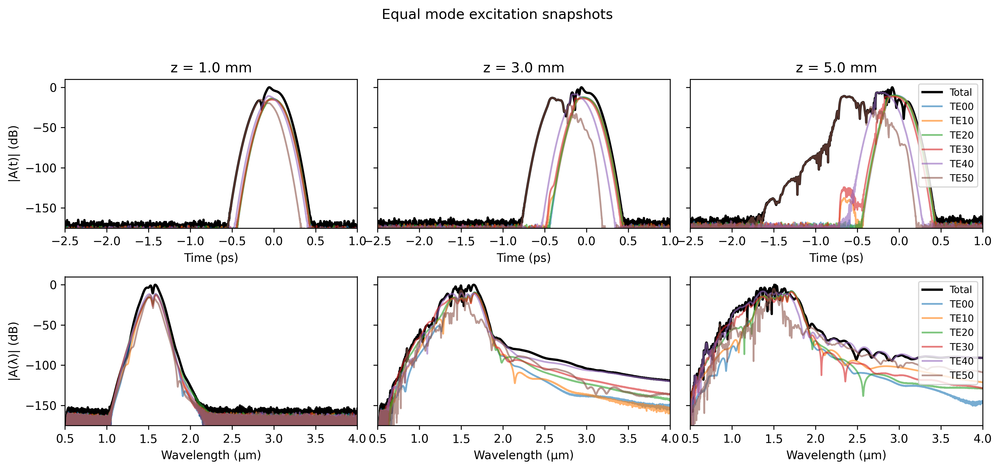

In [21]:
plot_length_snapshots(pulse_equal, result_equal, "Equal mode excitation snapshots", 
            time_ax_x_lim=[-2.5, 1], 
            spect_ax_x_lim=[0.5, 4], spect_ax_y_lim=[-175, 10])

## Fundamental + First Higher-Order Mode


Pulse min wavelength: -352718844301075.25 nm
Pulse max wavelength: 739531155698924.8 nm


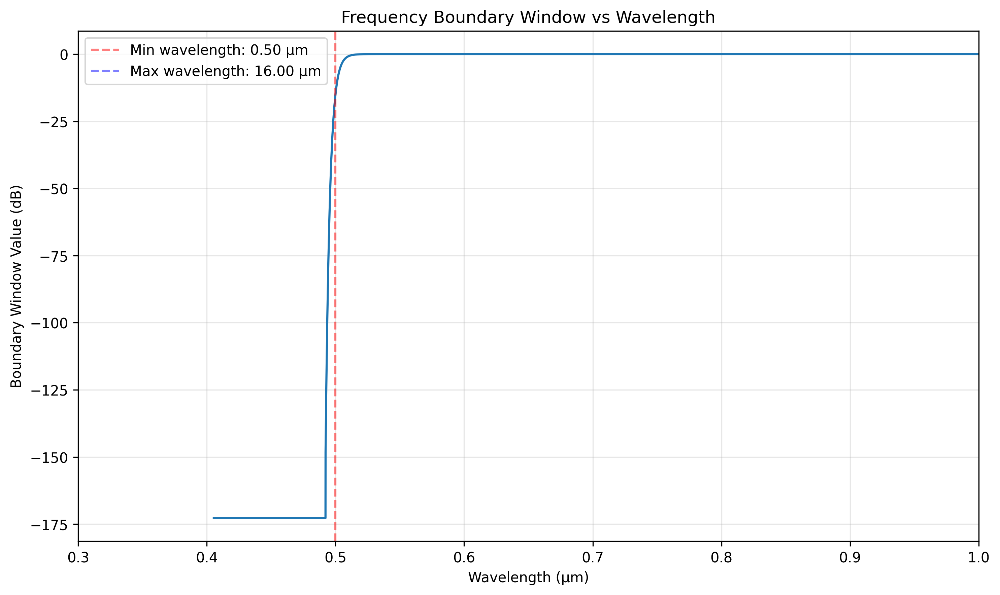

RK4IP Progress:   0%|          | 0.000/5.000 mm [00:00<?, ?mm/s]

In [22]:
modal_fundamental_first = jnp.array([1.0 + 0.0j, 1.0 + 0.0j])
z_points = jnp.linspace(0.0, 0.005, 201)
pulse_fundamental_first, result_fundamental_first = run_baseline_sim(modal_fundamental_first, z_points=z_points, peak_power_w=5000.0)

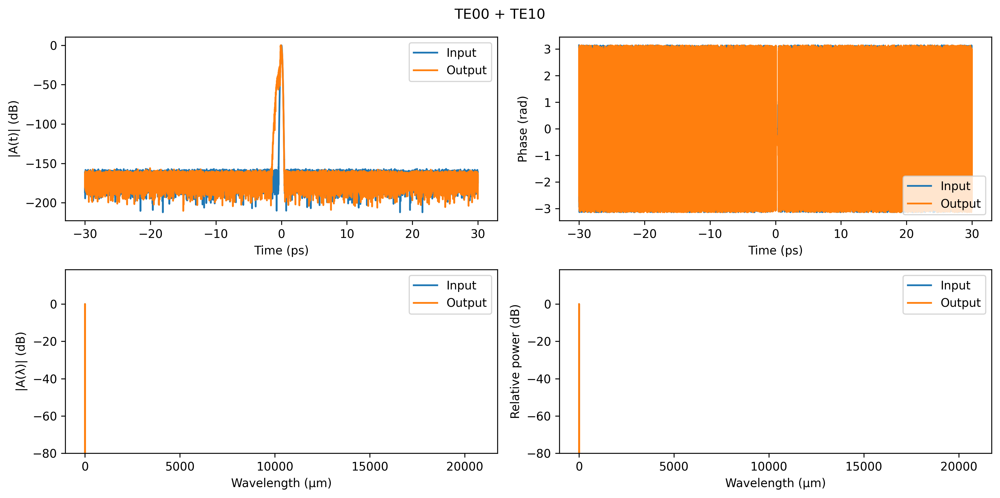

In [23]:
plot_input_output(pulse_fundamental_first, result_fundamental_first, "TE00 + TE10")

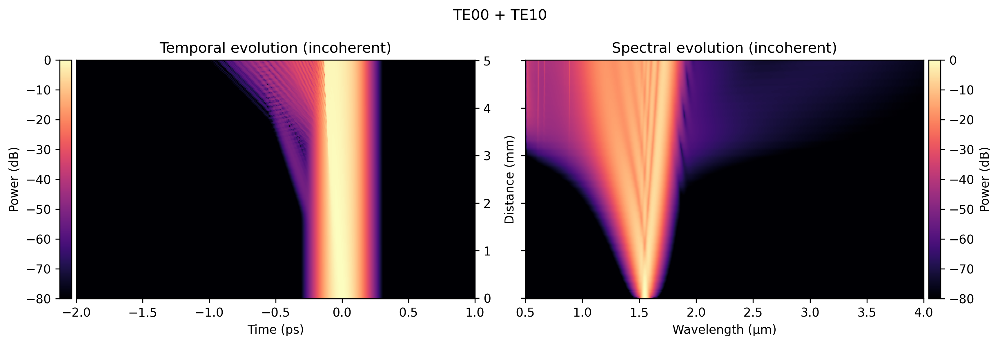

In [ ]:
fig, (ax_temporal, ax_spectral) = plt.subplots(1, 2, figsize=(12, 4), sharey=True)
result_fundamental_first.plot_propagation(ax_temporal, ax_spectral, temporal_sum_type="incoherent", spectral_sum_type="incoherent", layout="horizontal", time_ax_lim=(-2, 1))
fig.suptitle("TE00 + TE10")
fig.tight_layout()
plt.show()


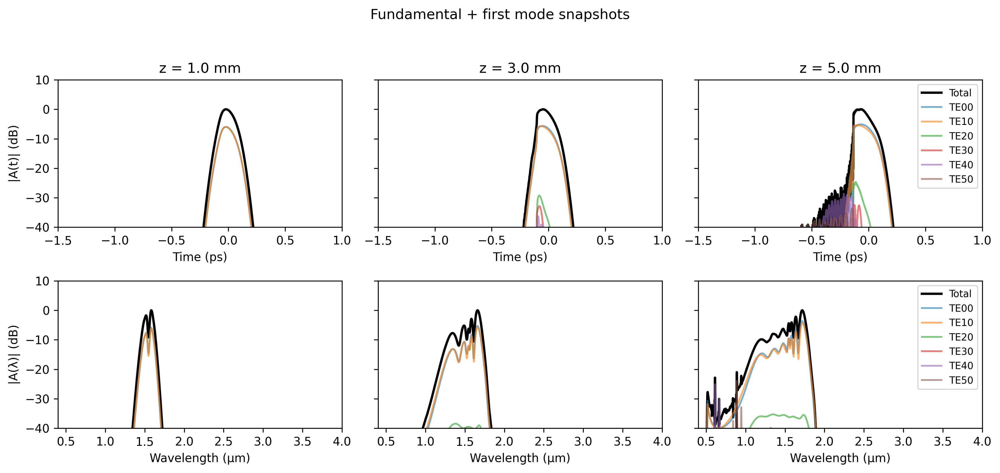

In [27]:
plot_length_snapshots(pulse_fundamental_first, result_fundamental_first, 
                        "Fundamental + first mode snapshots", 
                        time_ax_x_lim=[-1.5, 1], time_ax_y_lim=[-40, 10], 
                        spect_ax_x_lim=[0.4, 4], spect_ax_y_lim=[-40, 10])


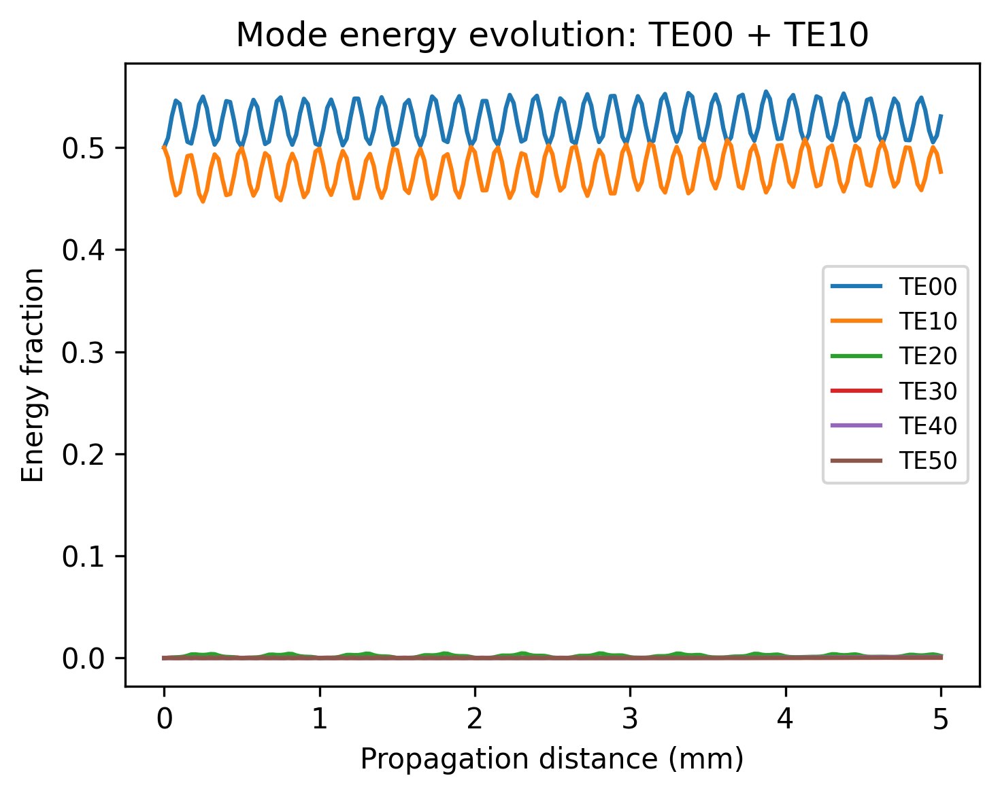

In [52]:
ys_first = np.asarray(result_fundamental_first["ys"])  # (z, modes, time)
z_mm = np.asarray(result_fundamental_first["ts"]) * 1e3
mode_energy = np.sum(np.abs(ys_first) ** 2, axis=-1)
total_energy = np.sum(mode_energy, axis=1, keepdims=True)
initial_total_energy = total_energy[0, 0]
energy_fraction = mode_energy / np.maximum(initial_total_energy, 1e-30)


plt.figure(figsize=(5, 4), dpi=300)
for mode_idx in range(num_modes):
    plt.plot(z_mm, energy_fraction[:, mode_idx], label=mode_labels[mode_idx])
plt.xlabel("Propagation distance (mm)")
plt.ylabel("Energy fraction")
plt.title("Mode energy evolution: TE00 + TE10")
plt.legend(loc="best", fontsize="small")
plt.tight_layout()



## Fundamental order + Second Higher-Order Mode (TE00 and TE20)


Pulse min wavelength: -352718844301075.25 nm
Pulse max wavelength: 739531155698924.8 nm


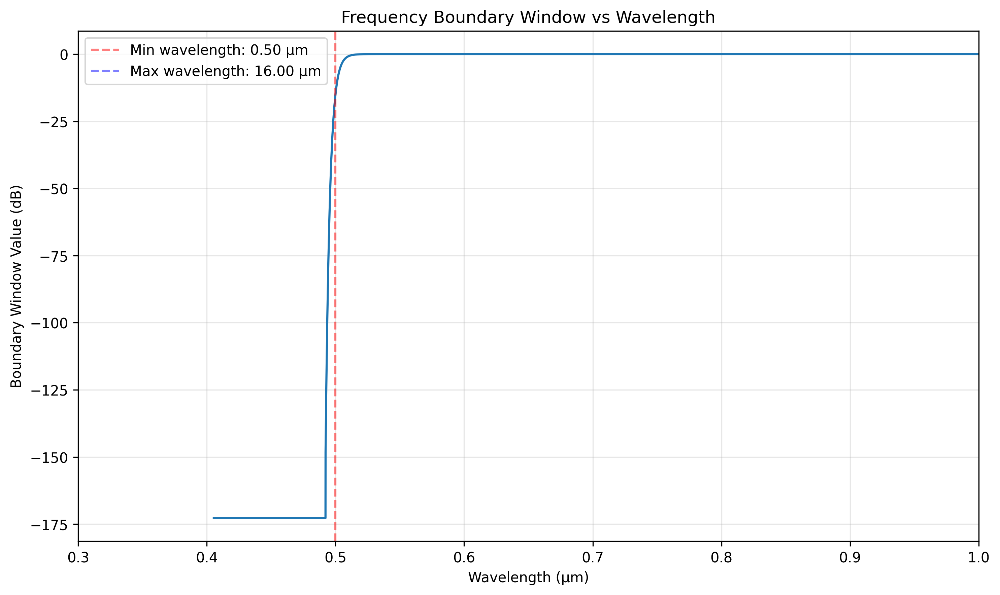

RK4IP Progress:   0%|          | 0.000/5.000 mm [00:00<?, ?mm/s]

In [29]:
modal_fundamental_second = jnp.array([1.0 + 0.0j, 0.0 + 0.0j, 1.0 + 0.0j, 0.0 + 0.0j])
z_points_1_2 = jnp.linspace(0.0, 0.005, 201)  # 0 to 10 mm
pulse_fundamental_second, result_fundamental_second = run_baseline_sim(modal_fundamental_second, z_points=z_points_1_2)

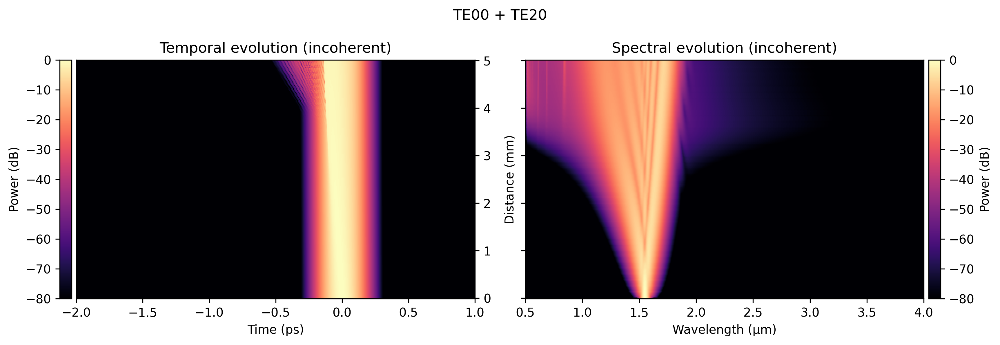

In [62]:
fig, (ax_temporal, ax_spectral) = plt.subplots(1, 2, figsize=(12, 4), sharey=True)
result_fundamental_second.plot_propagation(ax_temporal, ax_spectral, temporal_sum_type="incoherent", spectral_sum_type="incoherent", layout="horizontal", time_ax_lim=(-2, 1))
fig.suptitle("TE00 + TE20")
fig.tight_layout()
plt.show()

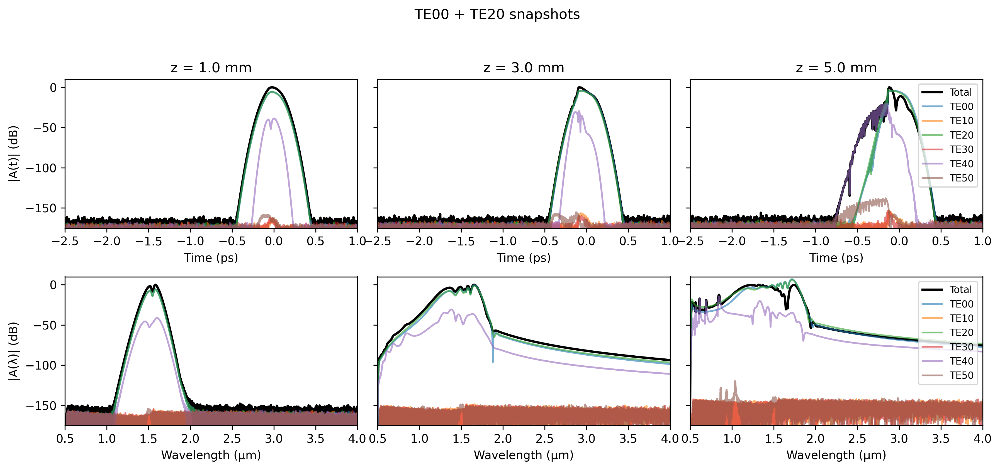

In [32]:
plot_length_snapshots(pulse_fundamental_second, result_fundamental_second, "TE00 + TE20 snapshots",
                        time_ax_x_lim=[-2.5, 1], time_ax_y_lim=[-175, 10], 
                        spect_ax_x_lim=[0.5, 4], spect_ax_y_lim=[-175, 10])


## Mode Energy Evolution (Fundamental + Second Mode)



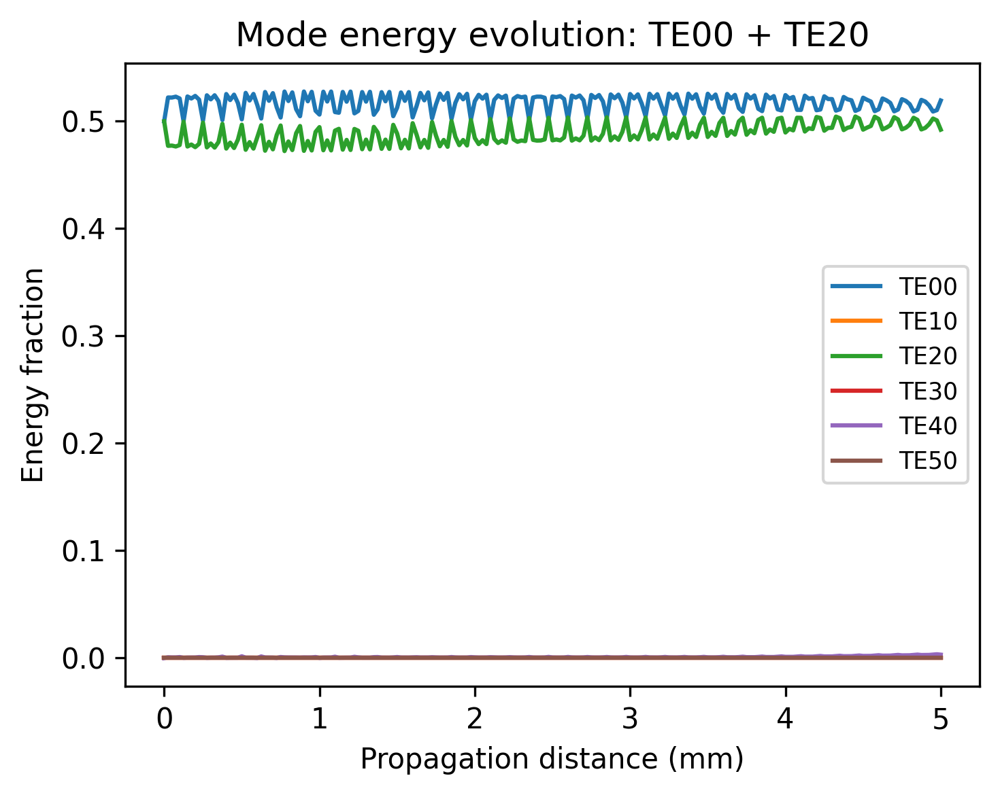

In [ ]:
ys_second = np.asarray(result_fundamental_second["ys"])  # (z, modes, time)
z_mm = np.asarray(result_fundamental_second["ts"]) * 1e3
mode_energy = np.sum(np.abs(ys_second) ** 2, axis=-1)
total_energy = np.sum(mode_energy, axis=1, keepdims=True)
max_total_energy = np.max(total_energy)
initial_total_energy = total_energy[0, 0] 
energy_fraction = mode_energy / np.maximum(initial_total_energy, 1e-30)

plt.figure(figsize=(5, 4), dpi=300)
for mode_idx in range(num_modes):
    plt.plot(z_mm, energy_fraction[:, mode_idx], label=mode_labels[mode_idx])
plt.xlabel("Propagation distance (mm)")
plt.ylabel("Energy fraction")
plt.title("Mode energy evolution: TE00 + TE20")
plt.legend(loc="best", fontsize="small")
plt.tight_layout()



## Zeroth order + Fourth Higher-Order Mode (TE00 and TE40)

Pulse min wavelength: -352718844301075.25 nm
Pulse max wavelength: 739531155698924.8 nm


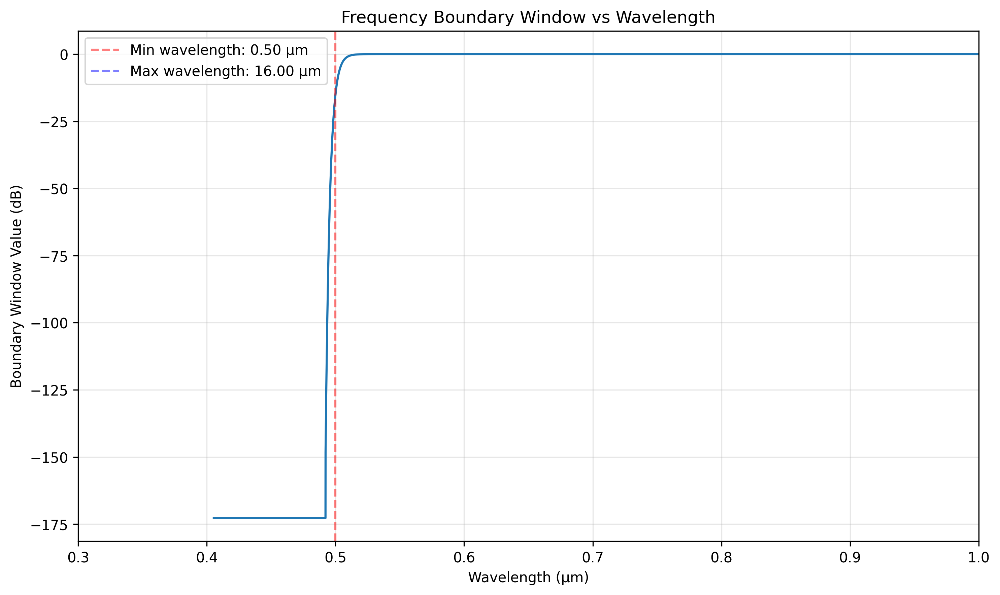

RK4IP Progress:   0%|          | 0.000/5.000 mm [00:00<?, ?mm/s]

In [34]:
modal_fundamental_fourth = jnp.array([1.0 + 0.0j, 0.0 + 0.0j, 0.0 + 0.0j, 0.0 + 0.0j, 1.0 + 0.0j, 0.0 + 0.0j])
pulse_fundamental_fourth, result_fundamental_fourth = run_baseline_sim(modal_fundamental_fourth)

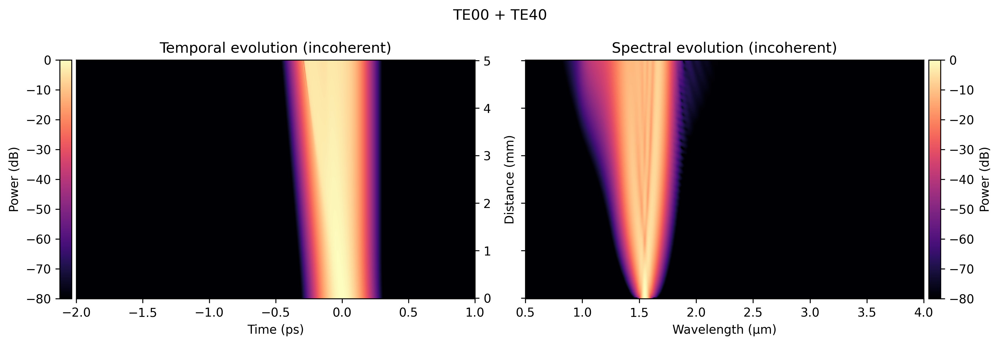

In [61]:
fig, (ax_temporal, ax_spectral) = plt.subplots(1, 2, figsize=(12, 4), sharey=True)
result_fundamental_fourth.plot_propagation(ax_temporal, ax_spectral, temporal_sum_type="incoherent", spectral_sum_type="incoherent", layout="horizontal", time_ax_lim=(-2, 1))
fig.suptitle("TE00 + TE40")
fig.tight_layout()
plt.show()

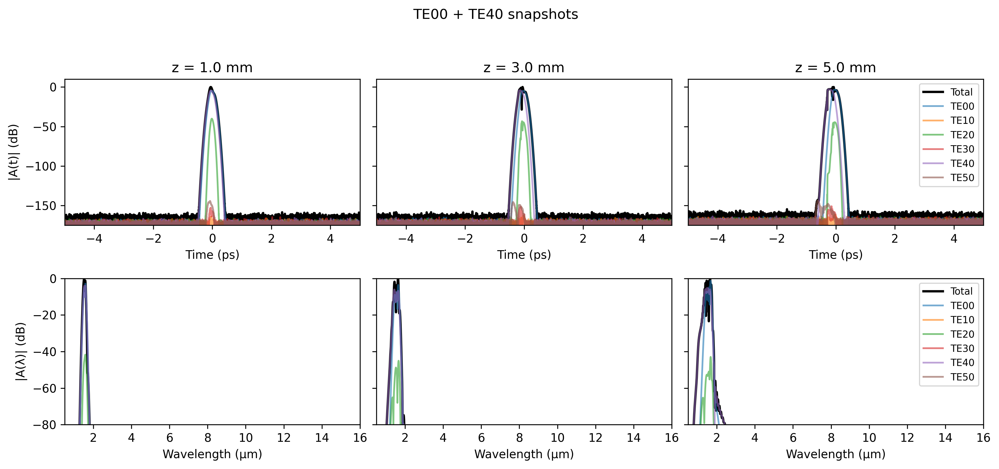

In [37]:
plot_length_snapshots(pulse_fundamental_fourth, result_fundamental_fourth, "TE00 + TE40 snapshots")

## Zeroth order + Fifth Higher-Order Mode (TE10 and TE50)


Pulse min wavelength: -352718844301075.25 nm
Pulse max wavelength: 739531155698924.8 nm


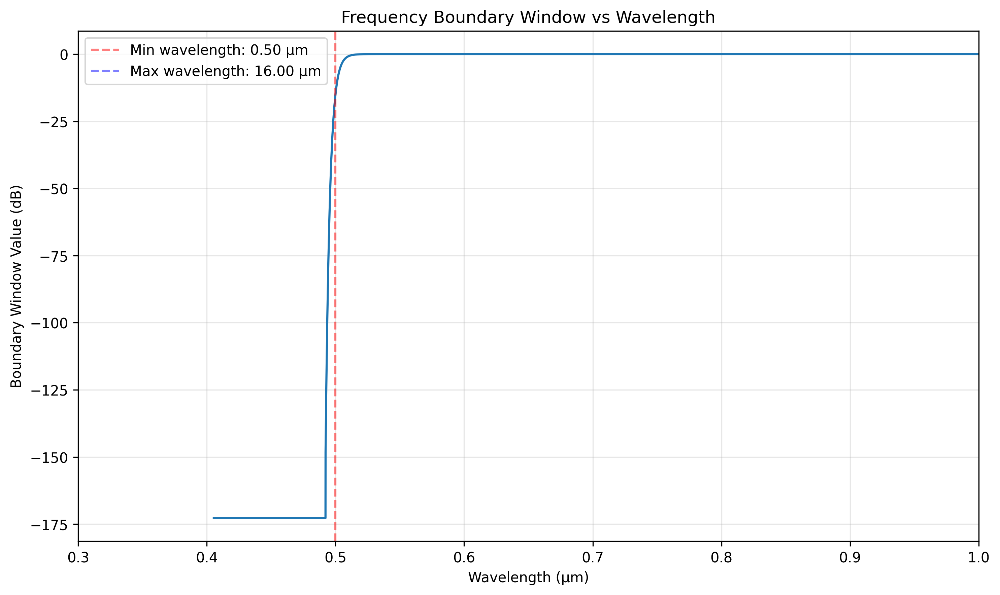

RK4IP Progress:   0%|          | 0.000/5.000 mm [00:00<?, ?mm/s]

In [38]:
modal_fundamental_fifth = jnp.array([1.0 + 0.0j, 0.0 + 0.0j, 0.0 + 0.0j, 0.0 + 0.0j, 0.0 + 0.0j, 1.0 + 0.0j])
pulse_fundamental_fifth, result_fundamental_fifth = run_baseline_sim(modal_fundamental_fifth)

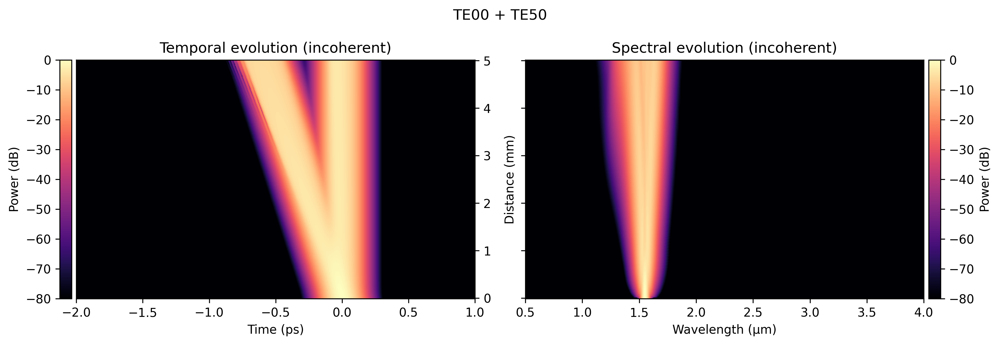

In [60]:
fig, (ax_temporal, ax_spectral) = plt.subplots(1, 2, figsize=(12, 4), sharey=True)
result_fundamental_fifth.plot_propagation(ax_temporal, ax_spectral, temporal_sum_type="incoherent", spectral_sum_type="incoherent", layout="horizontal", time_ax_lim=(-2, 1))
fig.suptitle("TE00 + TE50")
fig.tight_layout()
plt.show()

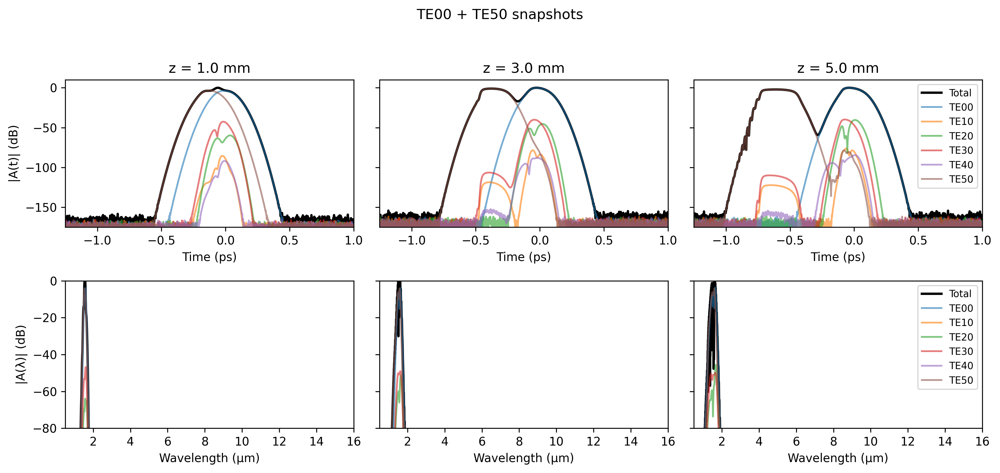

In [40]:
plot_length_snapshots(pulse_fundamental_fifth, result_fundamental_fifth, "TE00 + TE50 snapshots", [-1.25, 1])


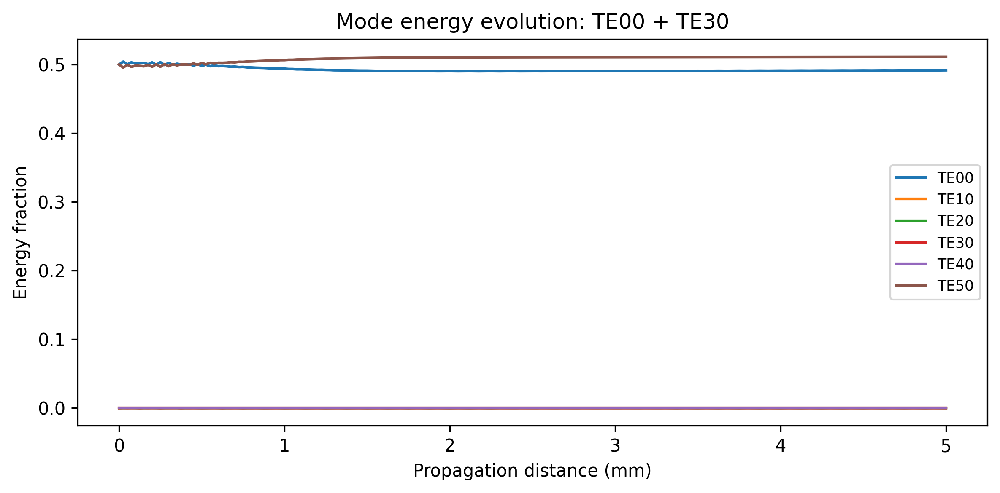

In [41]:
ys_first_third = np.asarray(result_fundamental_fifth["ys"])  # (z, modes, time)
z_mm = np.asarray(result_fundamental_fifth["ts"]) * 1e3
mode_energy = np.sum(np.abs(ys_first_third) ** 2, axis=-1)
total_energy = np.sum(mode_energy, axis=1, keepdims=True)
initial_total_energy = total_energy[0, 0]
energy_fraction = mode_energy / np.maximum(initial_total_energy, 1e-30)

plt.figure(figsize=(8, 4))
for mode_idx in range(num_modes):
    plt.plot(z_mm, energy_fraction[:, mode_idx], label=mode_labels[mode_idx])
plt.xlabel("Propagation distance (mm)")
plt.ylabel("Energy fraction")
plt.title("Mode energy evolution: TE00 + TE30")
plt.legend(loc="best", fontsize="small")
plt.tight_layout()



Pulse min wavelength: -352718844301075.25 nm
Pulse max wavelength: 739531155698924.8 nm


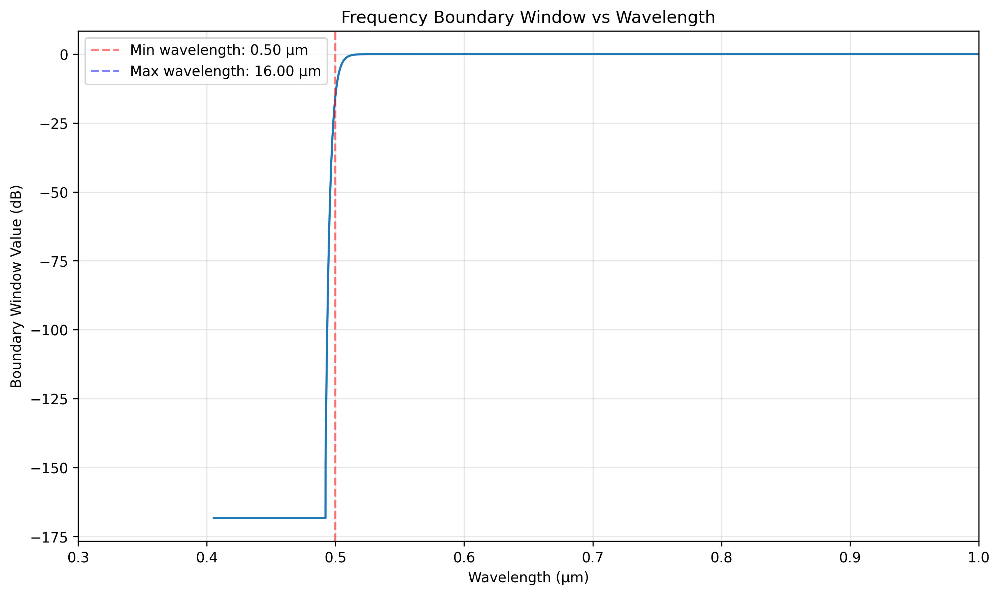

RK4IP Progress:   0%|          | 0.000/5.000 mm [00:00<?, ?mm/s]

In [43]:
z_points_1_5 = jnp.linspace(0.0, 0.005, 201)  # 0 to 10 mm
modal_higher = jnp.array([0.025, 0.025, 0.05, 0.1, 0.2, 0.7])
pulse_higher, result_higher = run_baseline_sim(modal_higher, peak_power_w=10000, z_points=z_points_1_5, dz=5e-6)


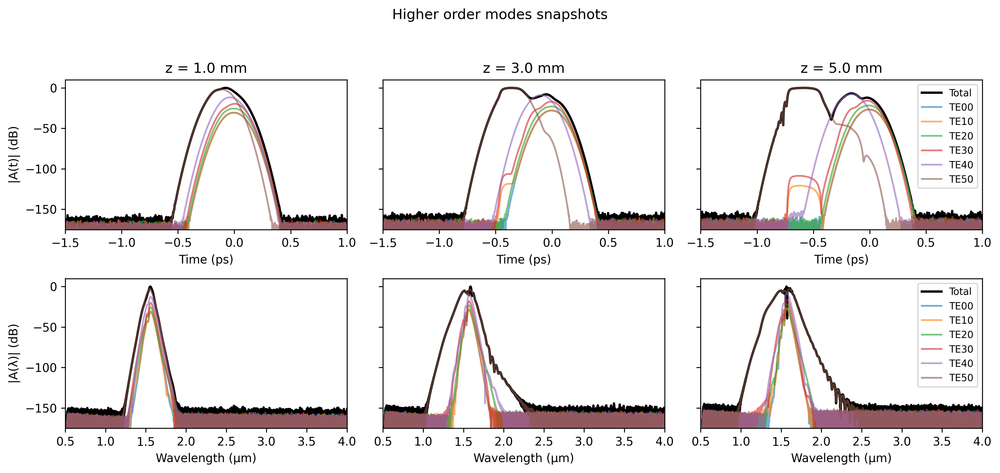

In [44]:
plot_length_snapshots(pulse_higher, result_higher, "Higher order modes snapshots", 
                        time_ax_x_lim=[-1.5, 1], time_ax_y_lim=[-175, 10], 
                        spect_ax_x_lim=[0.5, 4], spect_ax_y_lim=[-175, 10])


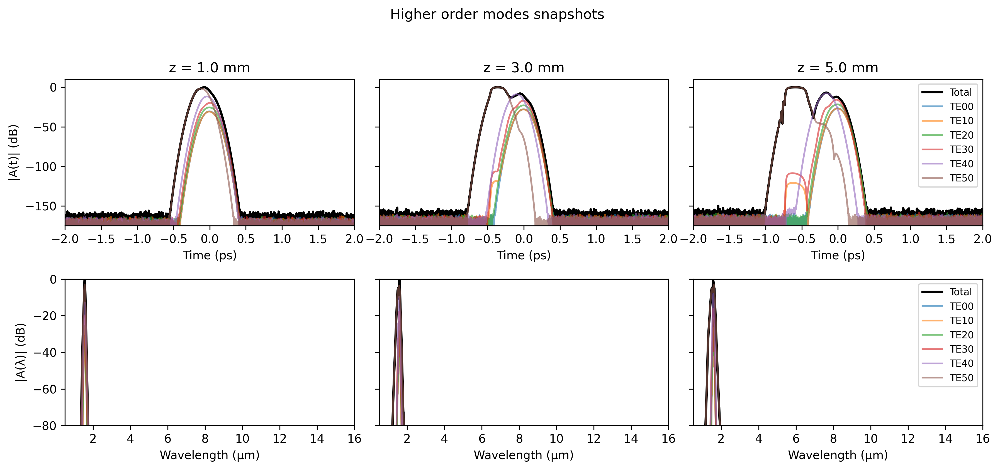

In [47]:
plot_length_snapshots(pulse_higher, result_higher, "Higher order modes snapshots", time_ax_x_lim=[-2, 2])
